# Семантическая сегментация сосудов сетчатки глаза

## Лабораторная работа 5

**Задача:** Бинарная сегментация кровеносных сосудов на изображениях сетчатки глаза с использованием архитектуры U-Net.

**Датасет:** DRIVE (Digital Retinal Images for Vessel Extraction) — 40 изображений сетчатки с экспертной разметкой сосудов.

**Эксперименты:**
1. Сравнение loss-функций: BCE, Dice, Combined
2. Влияние аугментаций данных
3. Сравнение архитектур: базовый U-Net vs U-Net + ResNet34

**Метрики:** Dice coefficient, IoU, Accuracy, Sensitivity, Specificity

## 1. Настройка окружения

In [1]:
import os
import sys
import json
import ssl
import warnings
import numpy as np
from pathlib import Path
from datetime import datetime

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

import torchvision.models as models
import torchvision.transforms.functional as TF

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from tqdm.notebook import tqdm

import cv2
from PIL import Image

warnings.filterwarnings('ignore')

# Обход проблемы с SSL-сертификатами (корпоративные прокси, self-signed certs)
ssl._create_default_https_context = ssl._create_unverified_context

# Определяем устройство
if torch.cuda.is_available():
    device = torch.device('cuda')
elif torch.backends.mps.is_available():
    device = torch.device('mps')
else:
    device = torch.device('cpu')

print(f'PyTorch: {torch.__version__}')
print(f'Устройство: {device}')

# Пути
NOTEBOOK_DIR = Path('.').resolve()
PROJECT_DIR = NOTEBOOK_DIR.parent if NOTEBOOK_DIR.name == 'notebooks' else NOTEBOOK_DIR
DATA_DIR = PROJECT_DIR / 'data' / 'DRIVE'
MODELS_DIR = PROJECT_DIR / 'models'
RESULTS_DIR = PROJECT_DIR / 'results' / 'metrics'

MODELS_DIR.mkdir(parents=True, exist_ok=True)
RESULTS_DIR.mkdir(parents=True, exist_ok=True)

print(f'Проект: {PROJECT_DIR}')

# Параметры
IMAGE_SIZE = 512
BATCH_SIZE = 4
NUM_EPOCHS = 50
LEARNING_RATE = 1e-4
PATIENCE = 10

PyTorch: 2.10.0
Устройство: mps
Проект: /Users/t.zherzdev/PycharmProjects/polytech_projects/5_SemanticSegmentation


## 2. Датасет DRIVE

**DRIVE** (Digital Retinal Images for Vessel Extraction) — стандартный бенчмарк для сегментации сосудов сетчатки глаза.

**Характеристики:**
- 40 цветных изображений сетчатки (565×584 пикселей), снятых камерой Canon CR5
- 20 изображений для обучения + 20 для тестирования
- Бинарные маски сосудов, размеченные вручную экспертами-офтальмологами
- **Дисбаланс классов:** сосуды занимают лишь ~12% пикселей, остальные ~88% — фон

**Разделение данных в нашем проекте:**
- **Train:** 16 изображений (из training set)
- **Validation:** 4 изображения (последние из training set)
- **Test:** 20 изображений (полный test set)

**Предобработка:**
- Resize до 512×512 (кратно 32 для U-Net)
- Нормализация изображений в диапазон [0, 1]
- Бинаризация масок: пиксели > 128 → 1 (сосуд), остальные → 0 (фон)

In [2]:
import requests
import zipfile
import shutil

DRIVE_URL = 'https://github.com/IstiaqAnsari/Retinal-Vessel-Segmentation/archive/refs/heads/master.zip'

def _reorganize_drive(data_dir):
    """Приводит структуру из репо к стандартной DRIVE."""
    src_data = data_dir / 'data'
    if not src_data.exists():
        return
    
    # Training: data/train -> training, vein -> 1st_manual
    src_train = src_data / 'train'
    dst_train = data_dir / 'training'
    if src_train.exists():
        dst_train.mkdir(parents=True, exist_ok=True)
        src_imgs = src_train / 'images'
        dst_imgs = dst_train / 'images'
        if src_imgs.exists():
            if dst_imgs.exists():
                shutil.rmtree(dst_imgs)
            shutil.move(str(src_imgs), str(dst_imgs))
        src_vein = src_train / 'vein'
        dst_manual = dst_train / '1st_manual'
        if src_vein.exists():
            if dst_manual.exists():
                shutil.rmtree(dst_manual)
            shutil.move(str(src_vein), str(dst_manual))
        src_mask = src_train / 'mask'
        dst_mask = dst_train / 'mask'
        if src_mask.exists():
            if dst_mask.exists():
                shutil.rmtree(dst_mask)
            shutil.move(str(src_mask), str(dst_mask))
    
    # Test: data/test -> test
    src_test = src_data / 'test'
    dst_test = data_dir / 'test'
    if src_test.exists():
        if dst_test.exists():
            shutil.rmtree(dst_test)
        shutil.move(str(src_test), str(dst_test))
    
    if src_data.exists():
        shutil.rmtree(src_data)


def download_drive(data_dir):
    """Скачивает датасет DRIVE."""
    data_dir = Path(data_dir)
    train_dir = data_dir / 'training' / 'images'
    test_dir = data_dir / 'test' / 'images'
    
    if train_dir.exists() and test_dir.exists():
        train_count = len(list(train_dir.glob('*.*')))
        test_count = len(list(test_dir.glob('*.*')))
        if train_count >= 20 and test_count >= 20:
            print(f'Датасет DRIVE уже скачан: {train_count} train, {test_count} test')
            return
    
    data_dir.mkdir(parents=True, exist_ok=True)
    zip_path = data_dir / 'drive.zip'
    
    print(f'Скачивание DRIVE датасета...')
    response = requests.get(DRIVE_URL, stream=True, timeout=180)
    response.raise_for_status()
    
    total_size = int(response.headers.get('content-length', 0))
    downloaded = 0
    
    with open(zip_path, 'wb') as f:
        for chunk in response.iter_content(chunk_size=8192):
            f.write(chunk)
            downloaded += len(chunk)
    
    print(f'Скачано: {downloaded / 1024 / 1024:.1f} MB')
    
    print('Распаковка...')
    with zipfile.ZipFile(zip_path, 'r') as z:
        z.extractall(data_dir)
    
    # Переносим содержимое из распакованной подпапки
    extracted_dirs = [d for d in data_dir.iterdir()
                      if d.is_dir() and d.name not in ('training', 'test')]
    if extracted_dirs:
        src = extracted_dirs[0]
        for item in src.iterdir():
            dst = data_dir / item.name
            if dst.exists():
                if dst.is_dir():
                    shutil.rmtree(dst)
                else:
                    dst.unlink()
            shutil.move(str(item), str(dst))
        shutil.rmtree(src)
    
    # Приводим к стандартной структуре DRIVE
    _reorganize_drive(data_dir)
    
    # Чистим лишнее
    if zip_path.exists():
        zip_path.unlink()
    for f in data_dir.glob('*.py'):
        f.unlink()
    for f in data_dir.glob('*.ipynb'):
        f.unlink()
    for f in data_dir.glob('*.md'):
        f.unlink()
    
    train_count = len(list((data_dir / 'training' / 'images').glob('*.*'))) if (data_dir / 'training' / 'images').exists() else 0
    test_count = len(list((data_dir / 'test' / 'images').glob('*.*'))) if (data_dir / 'test' / 'images').exists() else 0
    print(f'Датасет DRIVE готов: {train_count} train, {test_count} test')

download_drive(DATA_DIR)

Датасет DRIVE уже скачан: 20 train, 20 test


In [3]:
def load_image(path, is_mask=False):
    """Загружает изображение или маску."""
    img = Image.open(path)
    if is_mask:
        img = img.convert('L')
        arr = np.array(img)
        arr = (arr > 128).astype(np.float32)
        return arr
    else:
        img = img.convert('RGB')
        return np.array(img).astype(np.float32) / 255.0


class DRIVEDataset(Dataset):
    """Dataset для DRIVE."""
    
    def __init__(self, data_dir, split='train', image_size=512, augment=False, val_indices=None):
        super().__init__()
        self.data_dir = Path(data_dir)
        self.split = split
        self.image_size = image_size
        self.augment = augment and (split == 'train')
        self.images = []
        self.masks = []
        
        if split in ('train', 'val'):
            self._load_training_split(val_indices)
        else:
            self._load_test_split()
    
    def _load_training_split(self, val_indices=None):
        img_dir = self.data_dir / 'training' / 'images'
        mask_dir = self.data_dir / 'training' / '1st_manual'
        image_files = sorted(img_dir.glob('*.tif'))
        if not image_files:
            image_files = sorted(img_dir.glob('*.*'))
        
        all_pairs = []
        for img_path in image_files:
            img_num = img_path.stem.split('_')[0]
            mask_candidates = list(mask_dir.glob(f'{img_num}_manual1.*'))
            if not mask_candidates:
                mask_candidates = list(mask_dir.glob(f'{img_num}*.*'))
            if mask_candidates:
                all_pairs.append((img_path, mask_candidates[0]))
        
        if val_indices is None:
            val_indices = list(range(16, len(all_pairs)))
        
        if self.split == 'val':
            pairs = [all_pairs[i] for i in val_indices if i < len(all_pairs)]
        else:
            pairs = [all_pairs[i] for i in range(len(all_pairs)) if i not in val_indices]
        
        for img_path, mask_path in pairs:
            self.images.append(img_path)
            self.masks.append(mask_path)
    
    def _load_test_split(self):
        img_dir = self.data_dir / 'test' / 'images'
        mask_dir = self.data_dir / 'test' / '1st_manual'
        image_files = sorted(img_dir.glob('*.tif'))
        if not image_files:
            image_files = sorted(img_dir.glob('*.*'))
        
        for img_path in image_files:
            img_num = img_path.stem.split('_')[0]
            mask_candidates = list(mask_dir.glob(f'{img_num}_manual1.*'))
            if not mask_candidates:
                mask_candidates = list(mask_dir.glob(f'{img_num}*.*'))
            if mask_candidates:
                self.images.append(img_path)
                self.masks.append(mask_candidates[0])
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, idx):
        image = load_image(self.images[idx], is_mask=False)
        mask = load_image(self.masks[idx], is_mask=True)
        
        image = cv2.resize(image, (self.image_size, self.image_size), interpolation=cv2.INTER_LINEAR)
        mask = cv2.resize(mask, (self.image_size, self.image_size), interpolation=cv2.INTER_NEAREST)
        
        if self.augment:
            image, mask = self._apply_augmentations(image, mask)
        
        image = torch.from_numpy(image.transpose(2, 0, 1)).float()
        mask = torch.from_numpy(mask[np.newaxis, :, :]).float()
        return image, mask
    
    def _apply_augmentations(self, image, mask):
        if np.random.random() < 0.5:
            image = np.fliplr(image).copy()
            mask = np.fliplr(mask).copy()
        if np.random.random() < 0.5:
            image = np.flipud(image).copy()
            mask = np.flipud(mask).copy()
        k = np.random.randint(0, 4)
        if k > 0:
            image = np.rot90(image, k, axes=(0, 1)).copy()
            mask = np.rot90(mask, k, axes=(0, 1)).copy()
        if np.random.random() < 0.3:
            factor = np.random.uniform(0.8, 1.2)
            image = np.clip(image * factor, 0, 1)
        if np.random.random() < 0.3:
            mean = image.mean()
            factor = np.random.uniform(0.8, 1.2)
            image = np.clip((image - mean) * factor + mean, 0, 1)
        return image, mask

### Примеры изображений и масок

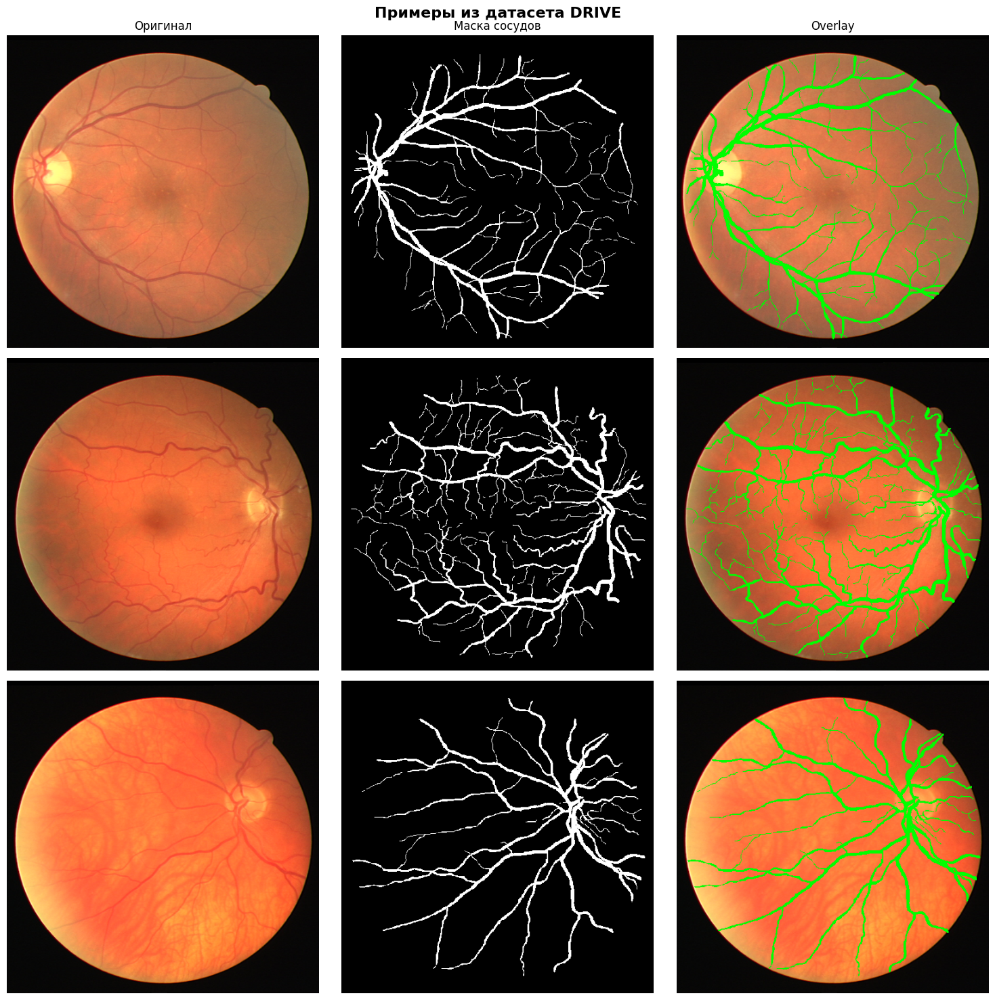

Доля сосудов на последнем изображении: 6.6%
Доля фона: 93.4%


In [4]:
# Показываем примеры из датасета
dataset_vis = DRIVEDataset(DATA_DIR, split='train', image_size=512, augment=False)

fig, axes = plt.subplots(3, 3, figsize=(15, 15))

for i in range(3):
    image, mask = dataset_vis[i]
    image_np = image.numpy().transpose(1, 2, 0)
    mask_np = mask.numpy()[0]
    
    # Оригинал
    axes[i, 0].imshow(image_np)
    axes[i, 0].set_title('Оригинал' if i == 0 else '')
    axes[i, 0].axis('off')
    
    # Маска
    axes[i, 1].imshow(mask_np, cmap='gray')
    axes[i, 1].set_title('Маска сосудов' if i == 0 else '')
    axes[i, 1].axis('off')
    
    # Overlay
    overlay = image_np.copy()
    overlay[mask_np > 0.5] = [0, 1, 0]
    axes[i, 2].imshow(overlay)
    axes[i, 2].set_title('Overlay' if i == 0 else '')
    axes[i, 2].axis('off')

plt.suptitle('Примеры из датасета DRIVE', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

# Статистика дисбаланса
vessel_ratio = mask_np.mean() * 100
print(f'Доля сосудов на последнем изображении: {vessel_ratio:.1f}%')
print(f'Доля фона: {100 - vessel_ratio:.1f}%')

## 3. Архитектура U-Net

**U-Net** (Ronneberger et al., 2015) — архитектура типа encoder-decoder со skip connections, изначально предложенная для сегментации биомедицинских изображений.

### Принцип работы

1. **Encoder (сжатие):** последовательность свёрточных блоков с MaxPooling уменьшает пространственное разрешение, извлекая всё более абстрактные признаки
2. **Bottleneck:** самый глубокий слой с максимальным числом каналов
3. **Decoder (восстановление):** ConvTranspose2d увеличивает разрешение обратно до исходного
4. **Skip connections:** конкатенация признаков из encoder с соответствующим уровнем decoder — это позволяет сохранить мелкие детали (тонкие сосуды)

### Две конфигурации в эксперименте

| | Базовый U-Net | U-Net + ResNet34 |
|---|---|---|
| Encoder | 4 уровня свёрток (64→128→256→512) | Предобученный ResNet34 (ImageNet) |
| Bottleneck | 1024 каналов | 512 каналов (layer4 ResNet) |
| Decoder | 4 уровня с skip connections | 5 уровней с skip connections |
| Параметры | ~31M | ~24.5M |
| Преимущество | Обучается с нуля | Transfer learning, лучшие начальные признаки |

**Выход модели:** логиты (без sigmoid). Sigmoid применяется внутри loss-функций при обучении и при инференсе для получения вероятностей.

In [5]:
class DoubleConv(nn.Module):
    """(Conv2d -> BN -> ReLU) x 2"""
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )
    def forward(self, x):
        return self.conv(x)


class UNet(nn.Module):
    """Базовый U-Net (~7.8M параметров)."""
    def __init__(self, in_channels=3, out_channels=1, features=None):
        super().__init__()
        if features is None:
            features = [64, 128, 256, 512]
        
        self.encoder_blocks = nn.ModuleList()
        self.pool = nn.MaxPool2d(2, 2)
        
        prev_ch = in_channels
        for f in features:
            self.encoder_blocks.append(DoubleConv(prev_ch, f))
            prev_ch = f
        
        self.bottleneck = DoubleConv(features[-1], features[-1] * 2)
        
        self.upconvs = nn.ModuleList()
        self.decoder_blocks = nn.ModuleList()
        
        rev = list(reversed(features))
        prev_ch = features[-1] * 2  # Выход bottleneck
        for f in rev:
            self.upconvs.append(nn.ConvTranspose2d(prev_ch, f, 2, 2))
            self.decoder_blocks.append(DoubleConv(f * 2, f))  # f*2 из-за cat со skip
            prev_ch = f  # Выход decoder блока
        
        self.final_conv = nn.Conv2d(features[0], out_channels, 1)
    
    def forward(self, x):
        skips = []
        for block in self.encoder_blocks:
            x = block(x)
            skips.append(x)
            x = self.pool(x)
        
        x = self.bottleneck(x)
        skips = list(reversed(skips))
        
        for i in range(len(self.upconvs)):
            x = self.upconvs[i](x)
            skip = skips[i]
            if x.shape != skip.shape:
                x = nn.functional.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=True)
            x = torch.cat([skip, x], dim=1)
            x = self.decoder_blocks[i](x)
        
        return self.final_conv(x)


class UNetResNet34(nn.Module):
    """U-Net с предобученным ResNet34 encoder (~24M параметров)."""
    def __init__(self, in_channels=3, out_channels=1, pretrained=True):
        super().__init__()
        weights = models.ResNet34_Weights.IMAGENET1K_V1 if pretrained else None
        resnet = models.resnet34(weights=weights)
        
        self.encoder0 = nn.Sequential(resnet.conv1, resnet.bn1, resnet.relu)
        self.pool0 = resnet.maxpool
        self.encoder1 = resnet.layer1
        self.encoder2 = resnet.layer2
        self.encoder3 = resnet.layer3
        self.encoder4 = resnet.layer4
        
        self.upconv4 = nn.ConvTranspose2d(512, 256, 2, 2)
        self.decoder4 = DoubleConv(256 + 256, 256)
        self.upconv3 = nn.ConvTranspose2d(256, 128, 2, 2)
        self.decoder3 = DoubleConv(128 + 128, 128)
        self.upconv2 = nn.ConvTranspose2d(128, 64, 2, 2)
        self.decoder2 = DoubleConv(64 + 64, 64)
        self.upconv1 = nn.ConvTranspose2d(64, 64, 2, 2)
        self.decoder1 = DoubleConv(64 + 64, 64)
        self.upconv0 = nn.ConvTranspose2d(64, 32, 2, 2)
        self.decoder0 = DoubleConv(32, 32)
        self.final_conv = nn.Conv2d(32, out_channels, 1)
    
    def forward(self, x):
        e0 = self.encoder0(x)
        e0_pool = self.pool0(e0)
        e1 = self.encoder1(e0_pool)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)
        
        d4 = self.upconv4(e4)
        d4 = self._pad_cat(d4, e3)
        d4 = self.decoder4(d4)
        d3 = self.upconv3(d4)
        d3 = self._pad_cat(d3, e2)
        d3 = self.decoder3(d3)
        d2 = self.upconv2(d3)
        d2 = self._pad_cat(d2, e1)
        d2 = self.decoder2(d2)
        d1 = self.upconv1(d2)
        d1 = self._pad_cat(d1, e0)
        d1 = self.decoder1(d1)
        d0 = self.upconv0(d1)
        d0 = self.decoder0(d0)
        return self.final_conv(d0)
    
    @staticmethod
    def _pad_cat(x, skip):
        if x.shape[2:] != skip.shape[2:]:
            x = nn.functional.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=True)
        return torch.cat([x, skip], dim=1)


def create_model(arch='unet', pretrained=True):
    """Создаёт модель по имени архитектуры."""
    if arch == 'unet':
        model = UNet()
    elif arch == 'resnet34':
        model = UNetResNet34(pretrained=pretrained)
    else:
        raise ValueError(f'Неизвестная архитектура: {arch}')
    
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    print(f'{arch}: {total:,} параметров ({trainable:,} обучаемых)')
    return model

# Проверка архитектур
print('Проверка моделей:')
test_input = torch.randn(1, 3, IMAGE_SIZE, IMAGE_SIZE)

model_unet = create_model('unet')
out = model_unet(test_input)
print(f'  U-Net: {test_input.shape} -> {out.shape}')

model_resnet = create_model('resnet34', pretrained=False)
out = model_resnet(test_input)
print(f'  ResNet34: {test_input.shape} -> {out.shape}')

del model_unet, model_resnet, test_input, out
torch.cuda.empty_cache() if torch.cuda.is_available() else None

Проверка моделей:
unet: 31,037,633 параметров (31,037,633 обучаемых)
  U-Net: torch.Size([1, 3, 512, 512]) -> torch.Size([1, 1, 512, 512])
resnet34: 24,451,585 параметров (24,451,585 обучаемых)
  ResNet34: torch.Size([1, 3, 512, 512]) -> torch.Size([1, 1, 512, 512])


## 4. Loss-функции и метрики

### Loss-функции

Выбор loss-функции критичен для задач с дисбалансом классов (сосуды ~12%, фон ~88%).

| Loss | Формула | Особенности |
|------|---------|-------------|
| **BCE** (Binary Cross-Entropy) | $-\frac{1}{N}\sum[y\log\hat{y} + (1-y)\log(1-\hat{y})]$ | Стандартная, но чувствительна к дисбалансу — модель может «лениться» и предсказывать всё как фон |
| **Dice Loss** | $1 - \frac{2|A \cap B|}{|A| + |B|}$ | Напрямую оптимизирует Dice coefficient, не зависит от дисбаланса |
| **Combined** | $0.5 \cdot BCE + 0.5 \cdot Dice$ | Сочетает стабильные градиенты BCE с инвариантностью Dice к дисбалансу |

### Метрики оценки

| Метрика | Что измеряет | Формула |
|---------|-------------|---------|
| **Dice** (F1) | Перекрытие предсказания с GT | $\frac{2 \cdot TP}{2 \cdot TP + FP + FN}$ |
| **IoU** (Jaccard) | Отношение пересечения к объединению | $\frac{TP}{TP + FP + FN}$ |
| **Accuracy** | Доля верных пикселей | $\frac{TP + TN}{TP + TN + FP + FN}$ |
| **Sensitivity** | Обнаружение сосудов (Recall) | $\frac{TP}{TP + FN}$ |
| **Specificity** | Правильное определение фона | $\frac{TN}{TN + FP}$ |

> **Примечание:** Accuracy может быть обманчиво высокой (~95%) из-за дисбаланса — модель, предсказывающая «всё фон», получит Accuracy ≈ 88%. Поэтому основная метрика — **Dice coefficient**.

In [6]:
# === Loss-функции ===

class DiceLoss(nn.Module):
    """Dice Loss = 1 - Dice Coefficient."""
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth
    
    def forward(self, logits, targets):
        probs = torch.sigmoid(logits)
        probs_flat = probs.view(probs.size(0), -1)
        targets_flat = targets.view(targets.size(0), -1)
        intersection = (probs_flat * targets_flat).sum(dim=1)
        union = probs_flat.sum(dim=1) + targets_flat.sum(dim=1)
        dice = (2.0 * intersection + self.smooth) / (union + self.smooth)
        return 1.0 - dice.mean()


class CombinedLoss(nn.Module):
    """0.5 * BCE + 0.5 * Dice."""
    def __init__(self):
        super().__init__()
        self.bce = nn.BCEWithLogitsLoss()
        self.dice = DiceLoss()
    
    def forward(self, logits, targets):
        return 0.5 * self.bce(logits, targets) + 0.5 * self.dice(logits, targets)


def create_criterion(loss_type):
    if loss_type == 'bce':
        return nn.BCEWithLogitsLoss()
    elif loss_type == 'dice':
        return DiceLoss()
    elif loss_type == 'combined':
        return CombinedLoss()
    else:
        raise ValueError(f'Неизвестный loss: {loss_type}')


# === Метрики ===

def dice_coefficient(pred, target, threshold=0.5, smooth=1e-6):
    with torch.no_grad():
        if pred.min() < 0 or pred.max() > 1:
            pred = torch.sigmoid(pred)
        pred_bin = (pred > threshold).float()
        pred_flat = pred_bin.view(-1)
        target_flat = target.float().view(-1)
        intersection = (pred_flat * target_flat).sum()
        return (2.0 * intersection + smooth) / (pred_flat.sum() + target_flat.sum() + smooth)


def iou_score(pred, target, threshold=0.5, smooth=1e-6):
    with torch.no_grad():
        if pred.min() < 0 or pred.max() > 1:
            pred = torch.sigmoid(pred)
        pred_bin = (pred > threshold).float()
        pred_flat = pred_bin.view(-1)
        target_flat = target.float().view(-1)
        intersection = (pred_flat * target_flat).sum()
        union = pred_flat.sum() + target_flat.sum() - intersection
        return (intersection + smooth) / (union + smooth)


def pixel_accuracy(pred, target, threshold=0.5):
    with torch.no_grad():
        if pred.min() < 0 or pred.max() > 1:
            pred = torch.sigmoid(pred)
        pred_bin = (pred > threshold).float()
        return (pred_bin == target.float()).float().mean()


def sensitivity_metric(pred, target, threshold=0.5, smooth=1e-6):
    with torch.no_grad():
        if pred.min() < 0 or pred.max() > 1:
            pred = torch.sigmoid(pred)
        pred_bin = (pred > threshold).float().view(-1)
        target_flat = target.float().view(-1)
        tp = (pred_bin * target_flat).sum()
        fn = ((1 - pred_bin) * target_flat).sum()
        return (tp + smooth) / (tp + fn + smooth)


def specificity_metric(pred, target, threshold=0.5, smooth=1e-6):
    with torch.no_grad():
        if pred.min() < 0 or pred.max() > 1:
            pred = torch.sigmoid(pred)
        pred_bin = (pred > threshold).float().view(-1)
        target_flat = target.float().view(-1)
        tn = ((1 - pred_bin) * (1 - target_flat)).sum()
        fp = (pred_bin * (1 - target_flat)).sum()
        return (tn + smooth) / (tn + fp + smooth)


def compute_all_metrics(pred, target, threshold=0.5):
    return {
        'dice': dice_coefficient(pred, target, threshold).item(),
        'iou': iou_score(pred, target, threshold).item(),
        'accuracy': pixel_accuracy(pred, target, threshold).item(),
        'sensitivity': sensitivity_metric(pred, target, threshold).item(),
        'specificity': specificity_metric(pred, target, threshold).item(),
    }

print('Loss-функции и метрики определены.')

Loss-функции и метрики определены.


## 5. Обучение моделей

### Гиперпараметры

| Параметр | Значение | Обоснование |
|----------|----------|-------------|
| Optimizer | Adam | Адаптивный LR, хорошо работает по умолчанию |
| Learning rate | 1e-4 | Стандартный для сегментации с Adam |
| Batch size | 4 | Ограничение по памяти GPU (512×512 изображения) |
| Scheduler | ReduceLROnPlateau | Снижает LR в 2 раза, если val Dice не улучшается 5 эпох |
| Early stopping | patience=10 | Останавливает обучение, если нет прогресса |
| Макс. эпох | 50 | Достаточно для сходимости на малом датасете |

### Аугментации (для экспериментов 4-6)

Аугментации особенно важны при 16 обучающих изображениях:
- **Горизонтальное/вертикальное отражение** (p=0.5) — сетчатка может быть зеркальной
- **Поворот на 90°/180°/270°** — ориентация камеры произвольна
- **Яркость ±20%** (p=0.3) — компенсация вариаций освещения
- **Контрастность ±20%** (p=0.3) — различия между камерами

> Геометрические аугментации применяются синхронно к изображению и маске, фотометрические — только к изображению.

### Конфигурация экспериментов

| № | Архитектура | Loss | Аугментации | Что проверяем |
|---|-------------|------|-------------|---------------|
| 1 | U-Net | BCE | Нет | Baseline |
| 2 | U-Net | Dice | Нет | Влияние loss на дисбаланс |
| 3 | U-Net | BCE + Dice | Нет | Комбинация loss |
| 4 | U-Net | BCE + Dice | Да | Влияние аугментаций |
| 5 | ResNet34 | BCE + Dice | Да | Предобученный encoder |
| 6 | ResNet34 | Dice | Да | ResNet34 + Dice |

In [7]:
EXPERIMENTS = [
    {'name': 'exp1_unet_bce_noaug',      'arch': 'unet',     'loss': 'bce',      'augment': False, 'desc': 'U-Net + BCE'},
    {'name': 'exp2_unet_dice_noaug',     'arch': 'unet',     'loss': 'dice',     'augment': False, 'desc': 'U-Net + Dice'},
    {'name': 'exp3_unet_combined_noaug', 'arch': 'unet',     'loss': 'combined', 'augment': False, 'desc': 'U-Net + Combined'},
    {'name': 'exp4_unet_combined_aug',   'arch': 'unet',     'loss': 'combined', 'augment': True,  'desc': 'U-Net + Combined + Aug'},
    {'name': 'exp5_resnet34_combined_aug','arch': 'resnet34', 'loss': 'combined', 'augment': True,  'desc': 'ResNet34 + Combined + Aug'},
    {'name': 'exp6_resnet34_dice_aug',   'arch': 'resnet34', 'loss': 'dice',     'augment': True,  'desc': 'ResNet34 + Dice + Aug'},
]

print(f'Всего экспериментов: {len(EXPERIMENTS)}')
for i, exp in enumerate(EXPERIMENTS, 1):
    print(f"  {i}. {exp['desc']}")

Всего экспериментов: 6
  1. U-Net + BCE
  2. U-Net + Dice
  3. U-Net + Combined
  4. U-Net + Combined + Aug
  5. ResNet34 + Combined + Aug
  6. ResNet34 + Dice + Aug


In [8]:
def train_epoch(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss = 0.0
    total_dice = 0.0
    n = 0
    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        loss = criterion(outputs, masks)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        total_dice += dice_coefficient(outputs, masks).item()
        n += 1
    return total_loss / n, total_dice / n


def validate(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0.0
    metrics_sum = {'dice': 0, 'iou': 0, 'accuracy': 0, 'sensitivity': 0, 'specificity': 0}
    n = 0
    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            loss = criterion(outputs, masks)
            total_loss += loss.item()
            m = compute_all_metrics(outputs, masks)
            for k in metrics_sum:
                metrics_sum[k] += m[k]
            n += 1
    avg_loss = total_loss / n
    avg_metrics = {k: v / n for k, v in metrics_sum.items()}
    return avg_loss, avg_metrics


def run_experiment(exp_config, device, data_dir, models_dir, results_dir,
                   num_epochs=NUM_EPOCHS, batch_size=BATCH_SIZE, lr=LEARNING_RATE, patience=PATIENCE):
    """Запускает один эксперимент."""
    name = exp_config['name']
    model_path = models_dir / f'{name}_best.pth'
    history_path = results_dir / f'{name}_history.json'
    
    # Пропускаем если модель уже обучена
    if model_path.exists():
        print(f'\n[ПРОПУСК] {exp_config["desc"]} — модель уже есть')
        if history_path.exists():
            with open(history_path) as f:
                return json.load(f)
        return None
    
    print(f'\n{"="*60}')
    print(f'Эксперимент: {exp_config["desc"]}')
    print(f'  arch={exp_config["arch"]}, loss={exp_config["loss"]}, aug={exp_config["augment"]}')
    print(f'{"="*60}')
    
    # Данные (num_workers=0 — в ноутбуке multiprocessing spawn не может сериализовать классы из __main__)
    train_ds = DRIVEDataset(data_dir, 'train', IMAGE_SIZE, augment=exp_config['augment'])
    val_ds = DRIVEDataset(data_dir, 'val', IMAGE_SIZE, augment=False)
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=0)
    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=0)
    
    # Модель
    model = create_model(exp_config['arch']).to(device)
    criterion = create_criterion(exp_config['loss'])
    optimizer = optim.Adam(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)
    
    # Обучение
    history = {'train_loss': [], 'val_loss': [], 'train_dice': [], 'val_dice': [],
               'val_iou': [], 'val_accuracy': [], 'val_sensitivity': [], 'val_specificity': [], 'lr': []}
    best_dice = 0.0
    no_improve = 0
    
    for epoch in tqdm(range(1, num_epochs + 1), desc=exp_config['desc']):
        train_loss, train_dice = train_epoch(model, train_loader, criterion, optimizer, device)
        val_loss, val_metrics = validate(model, val_loader, criterion, device)
        scheduler.step(val_metrics['dice'])
        
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['train_dice'].append(train_dice)
        history['val_dice'].append(val_metrics['dice'])
        history['val_iou'].append(val_metrics['iou'])
        history['val_accuracy'].append(val_metrics['accuracy'])
        history['val_sensitivity'].append(val_metrics['sensitivity'])
        history['val_specificity'].append(val_metrics['specificity'])
        history['lr'].append(optimizer.param_groups[0]['lr'])
        
        if val_metrics['dice'] > best_dice:
            best_dice = val_metrics['dice']
            no_improve = 0
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'val_dice': best_dice,
                'val_metrics': val_metrics,
                'config': exp_config,
            }, model_path)
        else:
            no_improve += 1
        
        if no_improve >= patience:
            print(f'  Early stopping на эпохе {epoch}')
            break
    
    with open(history_path, 'w') as f:
        json.dump(history, f, indent=2)
    
    print(f'  Лучший Val Dice: {best_dice:.4f}')
    
    del model, optimizer, scheduler
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    
    return history

In [9]:
# Запуск всех экспериментов
all_histories = {}

for exp in EXPERIMENTS:
    history = run_experiment(exp, device, DATA_DIR, MODELS_DIR, RESULTS_DIR)
    if history is not None:
        all_histories[exp['name']] = history

print(f'\nВсе эксперименты завершены! Обучено моделей: {len(all_histories)}')


[ПРОПУСК] U-Net + BCE — модель уже есть

[ПРОПУСК] U-Net + Dice — модель уже есть

[ПРОПУСК] U-Net + Combined — модель уже есть

Эксперимент: U-Net + Combined + Aug
  arch=unet, loss=combined, aug=True
unet: 31,037,633 параметров (31,037,633 обучаемых)


U-Net + Combined + Aug:   0%|          | 0/50 [00:00<?, ?it/s]

  Early stopping на эпохе 29
  Лучший Val Dice: 0.6832

Эксперимент: ResNet34 + Combined + Aug
  arch=resnet34, loss=combined, aug=True
resnet34: 24,451,585 параметров (24,451,585 обучаемых)


ResNet34 + Combined + Aug:   0%|          | 0/50 [00:00<?, ?it/s]

  Лучший Val Dice: 0.7159

Эксперимент: ResNet34 + Dice + Aug
  arch=resnet34, loss=dice, aug=True
resnet34: 24,451,585 параметров (24,451,585 обучаемых)


ResNet34 + Dice + Aug:   0%|          | 0/50 [00:00<?, ?it/s]

  Early stopping на эпохе 18
  Лучший Val Dice: 0.6141

Все эксперименты завершены! Обучено моделей: 6


## 6. Оценка на тестовом наборе

In [ ]:
def evaluate_on_test(exp_config, device, data_dir, models_dir, results_dir):
    """Оценивает модель на test set. Всегда возвращает предсказания для визуализации."""
    name = exp_config['name']
    model_path = models_dir / f'{name}_best.pth'
    results_path = results_dir / f'{name}_results.json'
    
    if not model_path.exists():
        print(f'  Модель не найдена: {model_path}')
        return None
    
    # Загружаем модель
    checkpoint = torch.load(model_path, map_location=device, weights_only=False)
    model = create_model(exp_config['arch'], pretrained=False).to(device)
    model.load_state_dict(checkpoint['model_state_dict'])
    model.eval()
    
    # Test данные (num_workers=0 для совместимости с ноутбуком)
    test_ds = DRIVEDataset(data_dir, 'test', IMAGE_SIZE)
    test_loader = DataLoader(test_ds, batch_size=4, shuffle=False, num_workers=0)
    
    # Метрики и предсказания
    metrics_sum = {'dice': 0, 'iou': 0, 'accuracy': 0, 'sensitivity': 0, 'specificity': 0}
    n = 0
    predictions = []
    
    with torch.no_grad():
        for images, masks in test_loader:
            images, masks = images.to(device), masks.to(device)
            outputs = model(images)
            probs = torch.sigmoid(outputs)
            
            for i in range(images.size(0)):
                m = compute_all_metrics(outputs[i:i+1], masks[i:i+1])
                for k in metrics_sum:
                    metrics_sum[k] += m[k]
                n += 1
                predictions.append((
                    images[i].cpu().numpy().transpose(1, 2, 0),
                    masks[i, 0].cpu().numpy(),
                    probs[i, 0].cpu().numpy(),
                ))
    
    avg_metrics = {k: v / n for k, v in metrics_sum.items()}
    
    results = {
        'experiment_name': name,
        'config': exp_config,
        'test_metrics': avg_metrics,
    }
    
    # Сохраняем/обновляем JSON с метриками
    with open(results_path, 'w') as f:
        json.dump(results, f, indent=2)
    
    print(f"  {exp_config['desc']}: Dice={avg_metrics['dice']:.4f}, IoU={avg_metrics['iou']:.4f}")
    
    del model
    torch.cuda.empty_cache() if torch.cuda.is_available() else None
    
    return results, predictions


# Оценка всех моделей (всегда прогоняем для получения предсказаний)
print('Оценка моделей на test set:\n')
all_results = {}
all_predictions = {}

for exp in EXPERIMENTS:
    result = evaluate_on_test(exp, device, DATA_DIR, MODELS_DIR, RESULTS_DIR)
    if result is not None:
        all_results[exp['name']] = result[0]
        all_predictions[exp['name']] = result[1]

## 7. Сводная таблица результатов

Ниже представлены метрики всех 6 экспериментов на **тестовом наборе** (20 изображений, не участвовавших в обучении).

In [11]:
# Загружаем все результаты из JSON (на случай если предыдущая ячейка использовала кэш)
for exp in EXPERIMENTS:
    name = exp['name']
    if name not in all_results:
        results_path = RESULTS_DIR / f'{name}_results.json'
        if results_path.exists():
            with open(results_path) as f:
                all_results[name] = json.load(f)

# Таблица результатов
print(f'{"Эксперимент":<35} {"Dice":>8} {"IoU":>8} {"Acc":>8} {"Sens":>8} {"Spec":>8}')
print('=' * 80)

for exp in EXPERIMENTS:
    name = exp['name']
    if name in all_results:
        m = all_results[name]['test_metrics']
        print(f"{exp['desc']:<35} {m['dice']:>8.4f} {m['iou']:>8.4f} "
              f"{m['accuracy']:>8.4f} {m['sensitivity']:>8.4f} {m['specificity']:>8.4f}")
    else:
        print(f"{exp['desc']:<35} {'—':>8} {'—':>8} {'—':>8} {'—':>8} {'—':>8}")

Эксперимент                             Dice      IoU      Acc     Sens     Spec
U-Net + BCE                           0.7453   0.5948   0.9563   0.7397   0.9773
U-Net + Dice                          0.7264   0.5714   0.9444   0.8421   0.9544
U-Net + Combined                      0.7378   0.5849   0.9504   0.8037   0.9647
U-Net + Combined + Aug                0.7058   0.5466   0.9481   0.7230   0.9700
ResNet34 + Combined + Aug             0.7389   0.5864   0.9477   0.8491   0.9574
ResNet34 + Dice + Aug                 0.6459   0.4776   0.9322   0.7088   0.9537


## 8. Сравнение Loss-функций

Сравниваем **эксперименты 1-3** (одинаковая архитектура U-Net, без аугментаций) — единственное различие в loss-функции.

**Что ожидаем:**
- BCE может недооценивать мелкие сосуды из-за дисбаланса (88% фона)
- Dice Loss должна лучше фокусироваться на области сосудов
- Combined Loss — компромисс между стабильностью обучения и качеством сегментации

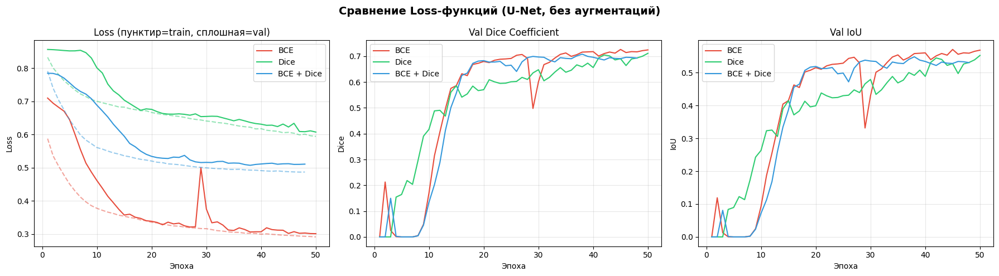

In [12]:
# Загружаем все истории обучения
for exp in EXPERIMENTS:
    name = exp['name']
    if name not in all_histories:
        history_path = RESULTS_DIR / f'{name}_history.json'
        if history_path.exists():
            with open(history_path) as f:
                all_histories[name] = json.load(f)

# Сравнение loss-функций (эксперименты 1-3)
loss_exps = ['exp1_unet_bce_noaug', 'exp2_unet_dice_noaug', 'exp3_unet_combined_noaug']
loss_labels = ['BCE', 'Dice', 'BCE + Dice']
colors = ['#e74c3c', '#2ecc71', '#3498db']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for i, (exp_name, label, color) in enumerate(zip(loss_exps, loss_labels, colors)):
    if exp_name not in all_histories:
        continue
    h = all_histories[exp_name]
    epochs = range(1, len(h['train_loss']) + 1)
    
    # Train/Val Loss
    axes[0].plot(epochs, h['train_loss'], color=color, linestyle='--', alpha=0.5)
    axes[0].plot(epochs, h['val_loss'], color=color, label=label)

    # Val Dice
    axes[1].plot(epochs, h['val_dice'], color=color, label=label)
    
    # Val IoU
    axes[2].plot(epochs, h['val_iou'], color=color, label=label)

axes[0].set_title('Loss (пунктир=train, сплошная=val)')
axes[0].set_xlabel('Эпоха')
axes[0].set_ylabel('Loss')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

axes[1].set_title('Val Dice Coefficient')
axes[1].set_xlabel('Эпоха')
axes[1].set_ylabel('Dice')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

axes[2].set_title('Val IoU')
axes[2].set_xlabel('Эпоха')
axes[2].set_ylabel('IoU')
axes[2].legend()
axes[2].grid(True, alpha=0.3)

plt.suptitle('Сравнение Loss-функций (U-Net, без аугментаций)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 9. Влияние аугментаций и архитектуры

Столбчатые диаграммы позволяют визуально сравнить все 6 экспериментов по каждой метрике.

**Ключевые сравнения:**
- **Exp3 vs Exp4** — влияние аугментаций (U-Net + Combined, без aug vs с aug)
- **Exp4 vs Exp5** — влияние архитектуры (U-Net vs ResNet34, оба с aug + Combined)
- **Exp5 vs Exp6** — сравнение loss для ResNet34 (Combined vs Dice)

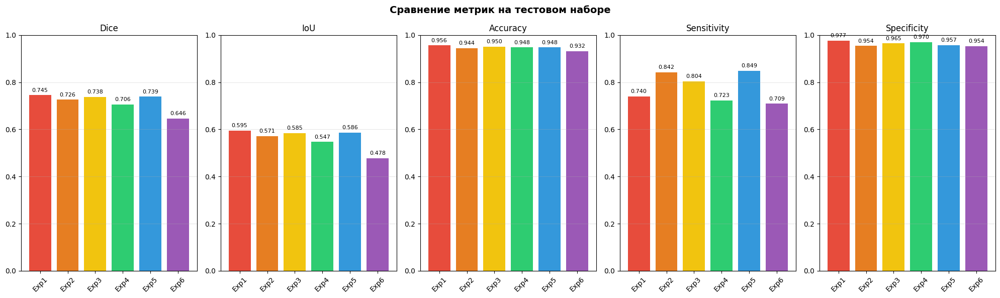


Легенда:
  Exp1: U-Net + BCE
  Exp2: U-Net + Dice
  Exp3: U-Net + Combined
  Exp4: U-Net + Combined + Aug
  Exp5: ResNet34 + Combined + Aug
  Exp6: ResNet34 + Dice + Aug


In [13]:
# Барплот всех метрик для всех экспериментов
metric_names = ['dice', 'iou', 'accuracy', 'sensitivity', 'specificity']
metric_labels = ['Dice', 'IoU', 'Accuracy', 'Sensitivity', 'Specificity']

# Собираем данные
exp_names = []
exp_descs = []
metric_values = {m: [] for m in metric_names}

for exp in EXPERIMENTS:
    if exp['name'] in all_results:
        exp_names.append(exp['name'])
        exp_descs.append(exp['desc'])
        for m in metric_names:
            metric_values[m].append(all_results[exp['name']]['test_metrics'][m])

if exp_names:
    fig, axes = plt.subplots(1, len(metric_names), figsize=(20, 6))
    x = np.arange(len(exp_names))
    bar_colors = ['#e74c3c', '#e67e22', '#f1c40f', '#2ecc71', '#3498db', '#9b59b6']
    
    for i, (m_name, m_label) in enumerate(zip(metric_names, metric_labels)):
        bars = axes[i].bar(x, metric_values[m_name], color=bar_colors[:len(x)])
        axes[i].set_title(m_label)
        axes[i].set_xticks(x)
        axes[i].set_xticklabels([f'Exp{j+1}' for j in range(len(x))], rotation=45)
        axes[i].set_ylim(0, 1)
        axes[i].grid(True, alpha=0.3, axis='y')
        
        # Значения на столбцах
        for bar, val in zip(bars, metric_values[m_name]):
            axes[i].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                        f'{val:.3f}', ha='center', va='bottom', fontsize=8)
    
    plt.suptitle('Сравнение метрик на тестовом наборе', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()
    
    # Легенда
    print('\nЛегенда:')
    for j, desc in enumerate(exp_descs):
        print(f'  Exp{j+1}: {desc}')
else:
    print('Нет результатов для визуализации')

## 10. Визуализация предсказаний

Для каждого тестового изображения показаны результаты **всех 6 моделей**:

- **Вероятности** — выход модели после sigmoid (тепловая карта)
- **Предсказание** — бинарная маска после порога 0.5
- **Overlay** — наложение на оригинал: зелёный = верно (TP), красный = ложное срабатывание (FP), синий = пропущенный сосуд (FN)
- **Ошибки** — абсолютная разница с Ground Truth (чем краснее, тем больше ошибок)

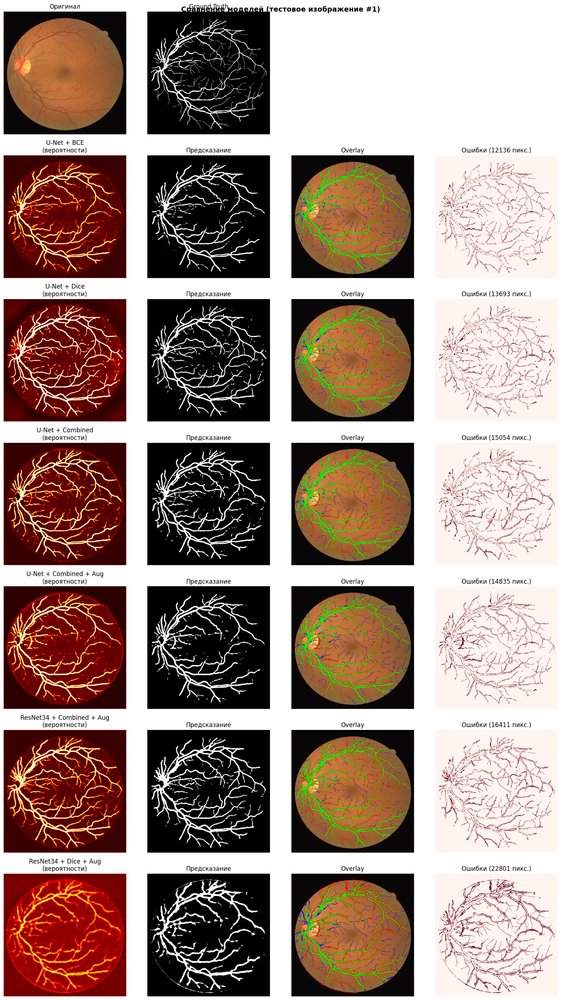

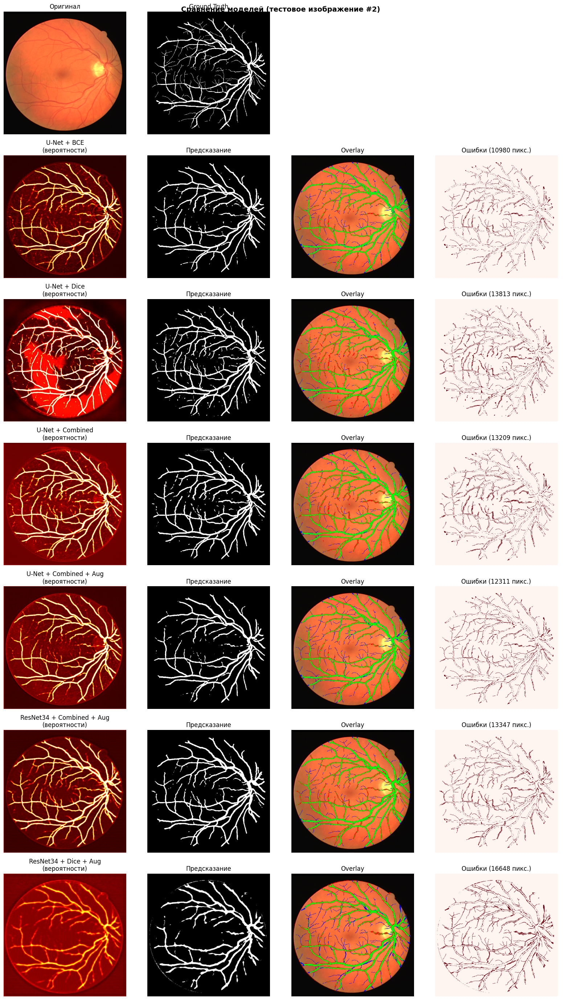

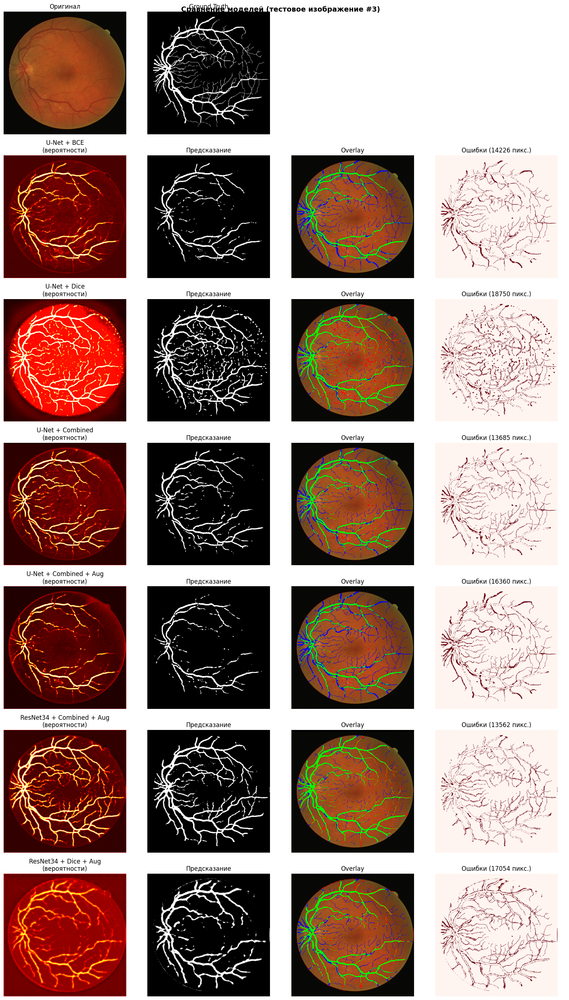

In [14]:
def show_predictions(predictions_dict, experiments, sample_idx=0):
    """Показывает предсказания всех моделей для одного изображения."""
    available = [(exp, predictions_dict[exp['name']]) for exp in experiments 
                 if exp['name'] in predictions_dict and len(predictions_dict[exp['name']]) > sample_idx]
    
    if not available:
        print('Нет предсказаний для визуализации')
        return
    
    n = len(available)
    fig, axes = plt.subplots(n + 1, 4, figsize=(16, 4 * (n + 1)))
    
    # Первая строка — оригинал и GT
    image, gt_mask, _ = available[0][1][sample_idx]
    axes[0, 0].imshow(image)
    axes[0, 0].set_title('Оригинал')
    axes[0, 0].axis('off')
    axes[0, 1].imshow(gt_mask, cmap='gray')
    axes[0, 1].set_title('Ground Truth')
    axes[0, 1].axis('off')
    axes[0, 2].axis('off')
    axes[0, 3].axis('off')
    
    # Строки моделей
    for i, (exp, preds) in enumerate(available, 1):
        img, gt, pred_prob = preds[sample_idx]
        pred_mask = (pred_prob > 0.5).astype(np.float32)
        
        # Предсказание
        axes[i, 0].imshow(pred_prob, cmap='hot')
        axes[i, 0].set_title(f"{exp['desc']}\n(вероятности)")
        axes[i, 0].axis('off')
        
        # Бинарная маска
        axes[i, 1].imshow(pred_mask, cmap='gray')
        axes[i, 1].set_title('Предсказание')
        axes[i, 1].axis('off')
        
        # Overlay
        overlay = img.copy()
        tp = (pred_mask > 0.5) & (gt > 0.5)
        fp = (pred_mask > 0.5) & (gt < 0.5)
        fn = (pred_mask < 0.5) & (gt > 0.5)
        overlay[tp] = [0, 1, 0]
        overlay[fp] = [1, 0, 0]
        overlay[fn] = [0, 0, 1]
        axes[i, 2].imshow(overlay)
        axes[i, 2].set_title('Overlay')
        axes[i, 2].axis('off')
        
        # Разница с GT
        diff = np.abs(pred_mask - gt)
        axes[i, 3].imshow(diff, cmap='Reds')
        axes[i, 3].set_title(f'Ошибки ({diff.sum():.0f} пикс.)')
        axes[i, 3].axis('off')
    
    plt.suptitle(f'Сравнение моделей (тестовое изображение #{sample_idx + 1})',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()

# Показываем для первых 3 тестовых изображений
for idx in range(min(3, 20)):
    show_predictions(all_predictions, EXPERIMENTS, sample_idx=idx)

## 11. Кривые обучения

Для каждого эксперимента показаны:
- **Синий пунктир** — train loss
- **Синяя линия** — val loss  
- **Красная линия** — val Dice coefficient (правая ось)
- **Жёлтая метка** — лучшая эпоха (модель сохранена в этой точке)

Быстрый рост Dice в первые эпохи и последующее плато — типичная картина для малых датасетов.

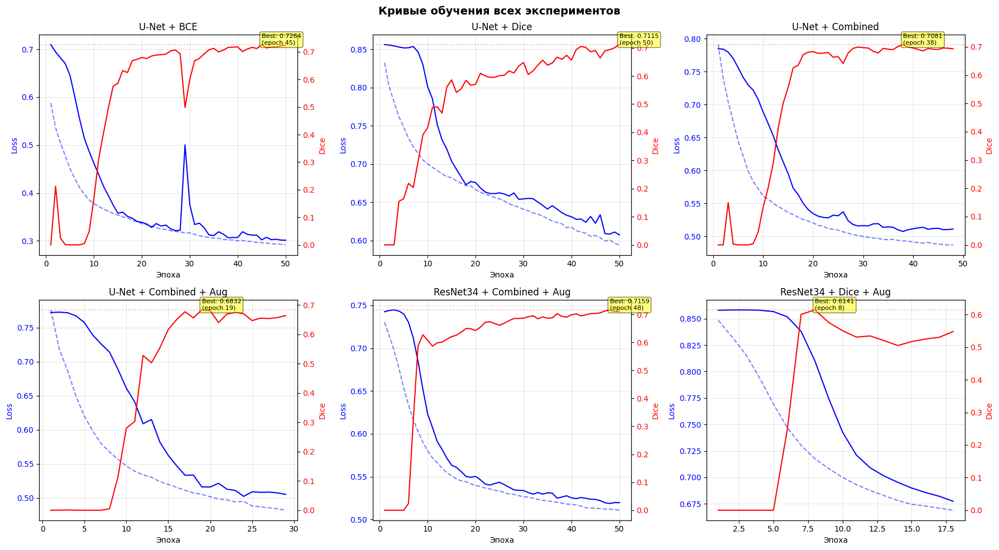

In [15]:
# Кривые обучения для всех экспериментов
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

colors_all = ['#e74c3c', '#e67e22', '#f1c40f', '#2ecc71', '#3498db', '#9b59b6']

for i, exp in enumerate(EXPERIMENTS):
    name = exp['name']
    if name not in all_histories:
        axes[i].text(0.5, 0.5, 'Нет данных', ha='center', va='center', transform=axes[i].transAxes)
        axes[i].set_title(exp['desc'])
        continue
    
    h = all_histories[name]
    epochs = range(1, len(h['train_loss']) + 1)
    
    ax1 = axes[i]
    ax2 = ax1.twinx()
    
    # Loss
    ax1.plot(epochs, h['train_loss'], 'b--', alpha=0.5, label='Train Loss')
    ax1.plot(epochs, h['val_loss'], 'b-', label='Val Loss')
    ax1.set_ylabel('Loss', color='blue')
    ax1.tick_params(axis='y', labelcolor='blue')
    
    # Dice
    ax2.plot(epochs, h['val_dice'], 'r-', label='Val Dice')
    ax2.set_ylabel('Dice', color='red')
    ax2.tick_params(axis='y', labelcolor='red')
    
    axes[i].set_title(exp['desc'])
    axes[i].set_xlabel('Эпоха')
    axes[i].grid(True, alpha=0.3)
    
    # Лучший Dice
    best_dice = max(h['val_dice'])
    best_epoch = h['val_dice'].index(best_dice) + 1
    ax2.axhline(y=best_dice, color='red', linestyle=':', alpha=0.3)
    ax2.annotate(f'Best: {best_dice:.4f}\n(epoch {best_epoch})',
                xy=(best_epoch, best_dice), fontsize=8,
                bbox=dict(boxstyle='round,pad=0.3', facecolor='yellow', alpha=0.5))

plt.suptitle('Кривые обучения всех экспериментов', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

## 12. Выводы

### Результаты экспериментов

| Эксперимент | Dice | IoU | Sensitivity |
|---|---|---|---|
| 1. U-Net + BCE | **0.745** | **0.595** | 0.740 |
| 2. U-Net + Dice | 0.726 | 0.571 | **0.842** |
| 3. U-Net + Combined | 0.738 | 0.585 | 0.804 |
| 4. U-Net + Combined + Aug | 0.706 | 0.547 | 0.723 |
| 5. ResNet34 + Combined + Aug | 0.739 | 0.586 | 0.849 |
| 6. ResNet34 + Dice + Aug | 0.646 | 0.478 | 0.709 |

### Влияние Loss-функций (эксп. 1-3)

- **BCE** показал лучший Dice (0.745), но самую низкую Sensitivity (0.740) — модель консервативна, пропускает мелкие сосуды, зато почти не даёт ложных срабатываний (Specificity 0.977)
- **Dice Loss** дал лучшую Sensitivity (0.842) — модель агрессивнее детектирует сосуды, но ценой большего числа FP (Specificity 0.954)
- **Combined Loss** — компромисс: Dice 0.738, Sensitivity 0.804

### Влияние аугментаций (эксп. 3 vs 4)

- Аугментации **не улучшили** результат для базового U-Net (Dice 0.738 → 0.706)
- Вероятная причина: при 16 обучающих изображениях аугментации добавляют шум в и без того малый сигнал, а early stopping срабатывает раньше, не давая модели сойтись
- Для более стабильного эффекта аугментаций нужен больший patience или больше эпох

### Влияние архитектуры (эксп. 4 vs 5)

- **ResNet34 encoder** значительно улучшил результат с аугментациями: Dice 0.706 → 0.739
- Предобученные на ImageNet признаки дают лучшую начальную точку, что компенсирует нестабильность от аугментаций
- ResNet34 + Combined + Aug (эксп. 5) показал лучшую Sensitivity (**0.849**) — наиболее полное обнаружение сосудов

### Общие наблюдения

1. **Лучший Dice:** U-Net + BCE (0.745) — простейшая конфигурация оказалась наиболее стабильной
2. **Лучшая Sensitivity:** ResNet34 + Combined + Aug (0.849) — для медицины важнее не пропустить сосуд
3. **Accuracy** (~95% у всех) обманчиво высокая из-за дисбаланса — Dice и IoU более информативны
4. Малый размер датасета (16 train) ограничивает эффективность как аугментаций, так и сложных архитектур
5. Результаты (Dice ~0.73) находятся в типичном диапазоне для DRIVE при обучении с нуля без продвинутых методов